In [1]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns
import os
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\Juan José\AppData\Local\Temp\ipykernel_34516\15628293.py:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [2]:
data = pd.read_csv("https://raw.githubusercontent.com/jsebastianzm/HR_T1_Analitica/main/data/data_preprocesamiento.csv")

In [3]:
data.head()

,Age,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeID,Gender,JobLevel,JobRole,...,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager,EnvironmentSatisfaction,JobSatisfaction,WorkLifeBalance,JobInvolvement,PerformanceRating,Attrition
0,51,Travel_Rarely,Sales,6.0,2,Life Sciences,1,Female,1,Healthcare Representative,...,6,1,0,0,3.0,4.0,2.0,3,3,No
1,31,Travel_Frequently,Research & Development,10.0,1,Life Sciences,2,Female,1,Research Scientist,...,3,5,1,4,3.0,2.0,4.0,2,4,Yes
2,32,Travel_Frequently,Research & Development,17.0,4,Other,3,Male,4,Sales Executive,...,2,5,0,3,2.0,2.0,1.0,3,3,No
3,38,Non-Travel,Research & Development,2.0,5,Life Sciences,4,Male,3,Human Resources,...,5,8,7,5,4.0,4.0,3.0,2,3,No
4,32,Travel_Rarely,Research & Development,10.0,1,Medical,5,Male,1,Sales Executive,...,2,6,0,4,4.0,1.0,3.0,3,3,No


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   BusinessTravel           4410 non-null   object 
 2   Department               4410 non-null   object 
 3   DistanceFromHome         4410 non-null   float64
 4   Education                4410 non-null   int64  
 5   EducationField           4410 non-null   object 
 6   EmployeeID               4410 non-null   int64  
 7   Gender                   4410 non-null   object 
 8   JobLevel                 4410 non-null   int64  
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   float64
 12  NumCompaniesWorked       4410 non-null   int64  
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [5]:
columns_category = ["Education", "EnvironmentSatisfaction", "JobSatisfaction","WorkLifeBalance", "JobInvolvement", "PerformanceRating"]
data[columns_category] = data[columns_category].astype("category")

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Age                      4410 non-null   int64   
 1   BusinessTravel           4410 non-null   object  
 2   Department               4410 non-null   object  
 3   DistanceFromHome         4410 non-null   float64 
 4   Education                4410 non-null   category
 5   EducationField           4410 non-null   object  
 6   EmployeeID               4410 non-null   int64   
 7   Gender                   4410 non-null   object  
 8   JobLevel                 4410 non-null   int64   
 9   JobRole                  4410 non-null   object  
 10  MaritalStatus            4410 non-null   object  
 11  MonthlyIncome            4410 non-null   float64 
 12  NumCompaniesWorked       4410 non-null   int64   
 13  PercentSalaryHike        4410 non-null   int64   
 14  StockOpt

In [7]:
ProfileReport(data, title="Análisis Exploratorio de Datos")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
dummies_variables = ["BussinessTravel", "Department", "Education", "EducationField", "Gender", "JobLevel", 
                     "Gender", "JobLevel", "JobRole", "MaritalStatus", "StockOptionLevel", "EnviromentSatisfaction", 
                     "JobSatisfaction", "WorkLifeBalance", "JobInvolvement", "PerformanceRating"]
for i in dummies_variables:
    pd.get_dummies(df['color'], prefix='color')

['Age', 'DistanceFromHome', 'EmployeeID', 'JobLevel', 'MonthlyIncome', 'NumCompaniesWorked', 'PercentSalaryHike', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


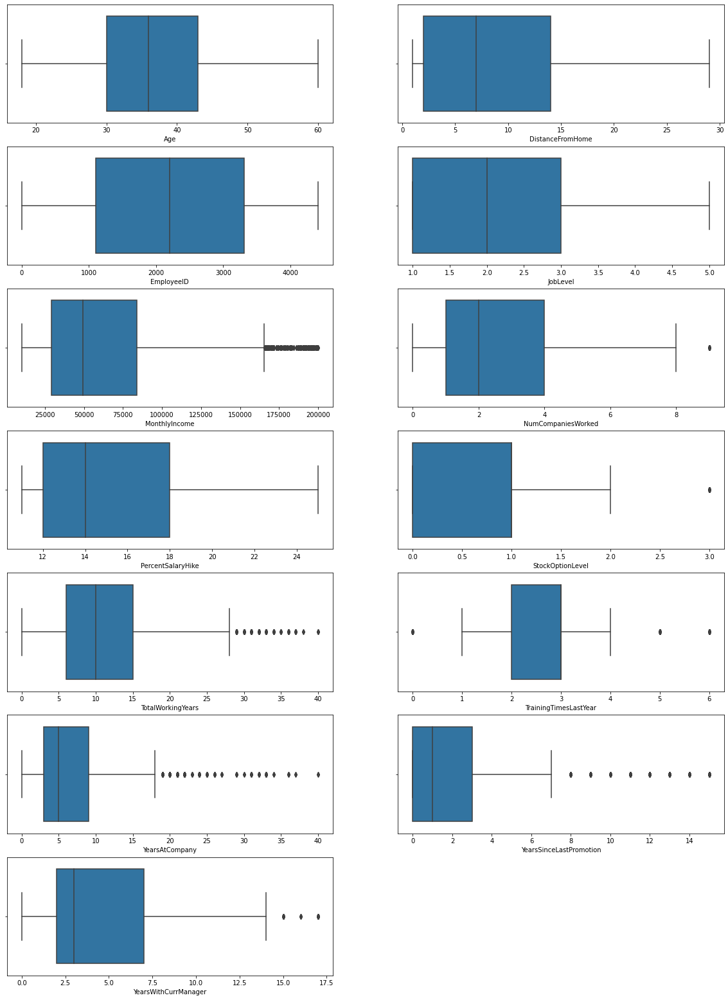

In [8]:
# --- Analisis de outliers ---
columns_boxplot = []
for i in data.columns:
    if data[i].dtype == 'int64' or data[i].dtype == 'float64':
        columns_boxplot.append(i)
print(columns_boxplot)
plt.figure(figsize=(20,40))
for i, col in enumerate(columns_boxplot, start=1):
    if data[col].dtype != 'object' and data[col].dtype != 'category':
        ax = plt.subplot(10, 2, i)
        sns.boxplot(x = data[col], ax=ax)
        plt.xlabel(col)
plt.show()

In [ ]:
# --- Analisis de outliers ---
columns_boxplot = []
for i in data.columns:
    if data[i].dtype == 'int64' or data[i].dtype == 'float64':
        columns_boxplot.append(i)
print(columns_boxplot)
plt.figure(figsize=(20,40))
for i, col in enumerate(columns_boxplot, start=1):
    if data[col].dtype != 'object' and data[col].dtype != 'category':
        ax = plt.subplot(10, 2, i)
        sns.boxplot(x = data[col], ax=ax)
        plt.xlabel(col)
plt.show()

<Figure size 576x432 with 0 Axes>

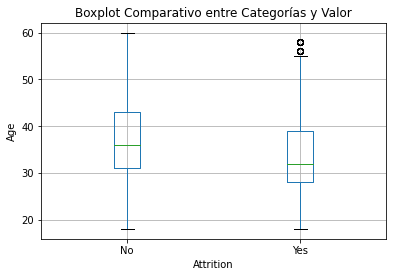

In [9]:
# Crear un boxplot comparativo
plt.figure(figsize=(8, 6))
data.boxplot(column='Age', by='Attrition')
plt.title('Boxplot Comparativo entre Categorías y Valor')
plt.suptitle('')  # Para quitar el título predeterminado
plt.xlabel('Attrition')
plt.ylabel('Age')
plt.show()

In [10]:
data.plot(kind="box",y="Attrition",x="Age")
plt.show()

TypeError: no numeric data to plot

C:\Users\Juan José\AppData\Local\Temp\ipykernel_4324\269756816.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.triu(np.ones_like(data.corr(), dtype=bool))
C:\Users\Juan José\AppData\Local\Temp\ipykernel_4324\269756816.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), center = 1, mask = mask, cbar = True, annot = True, ax = ax, annot_kws={"size":8})


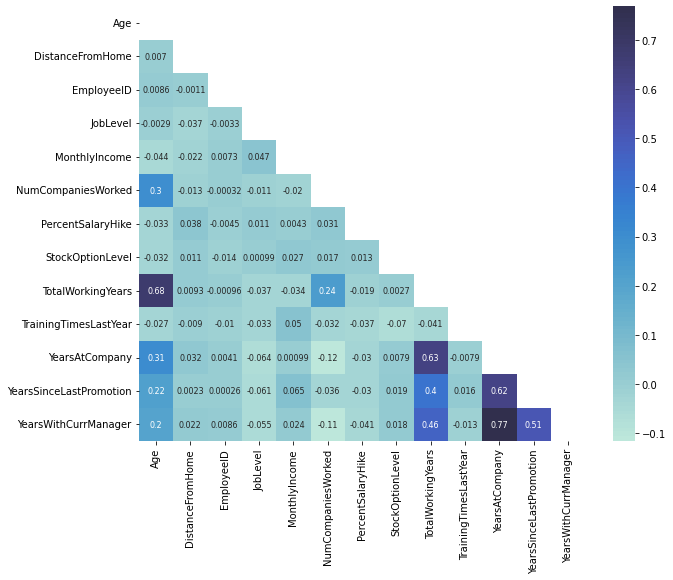

In [ ]:
# --- Correlation Map (Heatmap) ---
mask = np.triu(np.ones_like(data.corr(), dtype=bool))
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(data.corr(), center = 1, mask = mask, cbar = True, annot = True, ax = ax, annot_kws={"size":8})
plt.show()

Corregir las variables que son categoricas y revisar las otras caracteristicas o tipos 